# Tópico 3 - Atividade: Processamento de Áudio em Python

## Aluno
João Mário C. I. Lago

# Installs & Imports

In [16]:
!pip install -q numpy matplotlib scipy

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile

from typing import List, Dict, Optional, Union

import IPython.display as ipd
from IPython.display import display

In [18]:
def plot_fft(
    signal: np.array,
    fs: int,
    title: str = "FFT",
    freq_range: Optional[tuple] = None,
    normalize: bool = True,
    show_phase: bool = False,
    figsize: tuple = (10, 6)
) -> None:
    # Compute FFT
    f_fft = np.fft.fft(signal)
    N = len(f_fft)
    freq_axis = np.fft.fftfreq(N, 1/fs)[:N//2]

    # Get magnitude and phase
    magnitude = np.abs(f_fft)[:N//2]
    phase = np.angle(f_fft)[:N//2]

    # Normalize magnitude if requested
    if normalize:
        magnitude = magnitude / magnitude.max()

    # Set up subplots
    if show_phase:
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize)
    else:
        fig, ax1 = plt.subplots(1, 1, figsize=figsize)

    # Plot magnitude
    ax1.plot(freq_axis, magnitude)
    ax1.set_xlabel('Frequency (Hz)')
    ax1.set_ylabel('Normalized Magnitude' if normalize else 'Magnitude')
    ax1.set_title(f'{title} - Magnitude')
    ax1.grid(True)

    # Set frequency range
    if freq_range:
        ax1.set_xlim(freq_range)
    else:
        ax1.set_xlim(0, fs/2)

    # Plot phase if requested
    if show_phase:
        ax2.plot(freq_axis, phase)
        ax2.set_xlabel('Frequency (Hz)')
        ax2.set_ylabel('Phase (radians)')
        ax2.set_title(f'{title} - Phase')
        ax2.grid(True)

        if freq_range:
            ax2.set_xlim(freq_range)
        else:
            ax2.set_xlim(0, fs/2)

    plt.tight_layout()
    plt.show()


# 1) Criar uma função para gerar um tom senoidal.

Parâmetros de entrada:
* frequência (Hz)
* duração (s)
* amplitude (0 a 1)
* frequência de amostragem (Hz)

Verfique se a frequência da saída está correta medindo um período do sinal.


In [19]:
def tonegen(frequency: int, duration: float, amplitude: float, fs: int) -> np.array:
    """
    Generates a sinusoidal signal with the given parameters.

    Args:
        frequency (int): The frequency of the signal in Hz.
        duration (float): The duration of the signal in seconds.
        amplitude (float): The amplitude of the signal.
        fs (int): The sampling frequency in Hz.

    Returns:
        List[float]: The generated signal.
    """

    t = np.arange(0.0, duration, 1.0/float(fs))
    signal = amplitude * np.sin(2 * np.pi * float(frequency) * t)
    return signal


Verfique se a frequência da saída está correta medindo um período do sinal

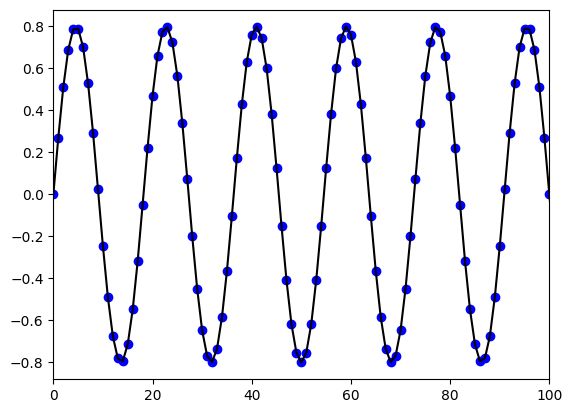

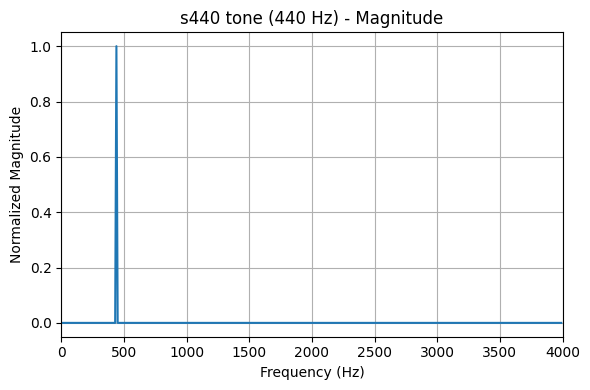

In [20]:
s440 = tonegen(440, 0.1, 0.8, 8000)

# Plot from 0  to 10ms
plt.xlim(0, 100)
plt.plot(s440,'bo', s440, 'k')
plt.show()

# FFT with only positive frequencies and normalized magnitude
plot_fft(s440, 8000, "s440 tone (440 Hz)", freq_range=(0, 4000), figsize=(6, 4))

# Save WAV file
wavfile.write('./generated/s440.wav', 8000, s440)
# Play the audio
display(ipd.Audio(s440, rate=8000))


# 2) Criar uma função que receba um vetor com uma sequência de dígitos e gere tons DTMF correspondentes.

Parâmetros:
* Sequência de dígitos
* Duração em segundos por dígito
* Intervalo em segundos entre dígitos
* Amplitude (0 a 1).

O sinal de saída deve ter frequência de amostragem de 8 kHz.

In [21]:
# DTMF tones
dtmf_tones: Dict[str, List[int]] = {
    '0': [1336, 941],
    '1': [1209, 697],
    '2': [1336, 697],
    '3': [1477, 697],
    '4': [1209, 770],
    '5': [1336, 770],
    '6': [1477, 770],
    '7': [1209, 852],
    '8': [1336, 852],
    '9': [1477, 852],
    'A': [1633, 697],
    'B': [1633, 770],
    'C': [1633, 852],
    'D': [1633, 941],
    '*': [1209, 941],
    '#': [1477, 941],
}


def dtmfgen(digits: str, duration: float, interval: float, amplitude: float, fs: int = 8000) -> np.array:
    """
    Encodes a sequence of digits into a DTMF signal.

    Args:
        digits (str): The sequence of digits to encode.
        duration (float): The duration of each digit in seconds.
        interval (float): The interval between digits in seconds.
        amplitude (float): The amplitude of the signal.

    Returns:
        List[float]: The encoded signal.
    """

    digits = digits.upper()
    if not all(digit in dtmf_tones for digit in digits):
        raise ValueError("Invalid digits in the sequence")

    signal = []
    for digit in digits:
        tone_1 = tonegen(dtmf_tones[digit][0], duration, amplitude, fs)
        tone_2 = tonegen(dtmf_tones[digit][1], duration, amplitude, fs)
        signal.extend(tone_1 + tone_2)
        signal.extend(np.zeros(int(interval * fs)))
    return np.array(signal)

dtmf_example = dtmfgen('1234567890ABCD*#', 0.1, 0.1, 0.8)

# Save as wav
wavfile.write('./generated/dtmf_example.wav', 8000, dtmf_example)

# Play the audio
display(ipd.Audio(dtmf_example, rate=8000))

Verificando a demodulação do sinal DTMF gerado usando Ocenaudio

<div style="display: flex; justify-content: center;">
    <img src="./assets/dtmf_example_decode.png" alt="DTMF Example" height="500">
</div>


# 3) Criar uma função para remover uma em cada duas amostras de um sinal, criando um novo sinal que tem somente as amostras de índice ímpar do sinal original.

In [22]:
def halfsp(x: np.array) -> np.array:
    return x[0::2]

In [23]:
x = np.array([7, 3, 9, 1, 0, 4])

# Resultado esperado: [7, 9, 0]
print(halfsp(x))

[7 9 0]


# 4) Criar uma função para criar um novo sinal que insere uma nova amostra entre cada duas amostras. Essa nova amostra é a média das duas amostras vizinhas.

In [24]:
def doublesp(x: np.array) -> np.array:
    result = []
    for i in range(len(x)):
        result.append(x[i])
        if i < len(x) - 1:
            result.append((x[i] + x[i+1]) / 2)
    return np.array(result)

In [25]:
x = np.array([7, 3, 9, 1, 0, 4])
# Resultado esperado: [7 5 3 6 9 5 1 0.5 0 2 4]
print(doublesp(x))

[7.  5.  3.  6.  9.  5.  1.  0.5 0.  2.  4. ]


# 5) Gere um tom de 220 Hz. Aplique a função halfsp (mantendo a mesma frequencia de amostragem).Escute o resultado antes e depois da aplicação. O que ocorre na frequência e no tempo? Mostre graficamente o resultado na frequência através da transformada de Fourier (implementada pela função numpy.fft).

Após a aplicação da função halfsp, o sinal fica com a metade das amostras, ou seja o tempo de duração é a metade do original e a frequência é o dobro do original.

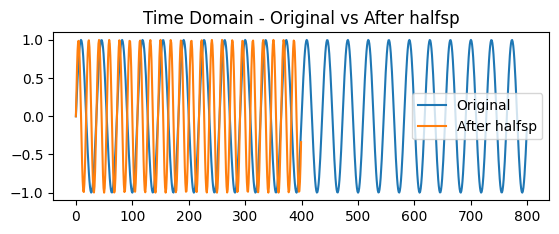

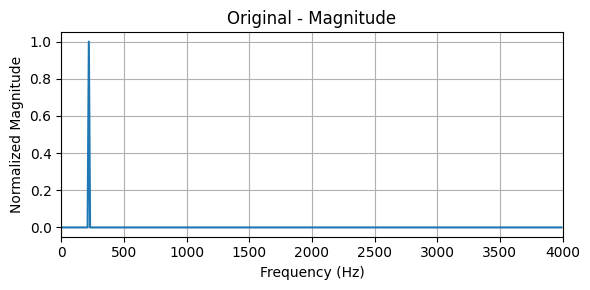

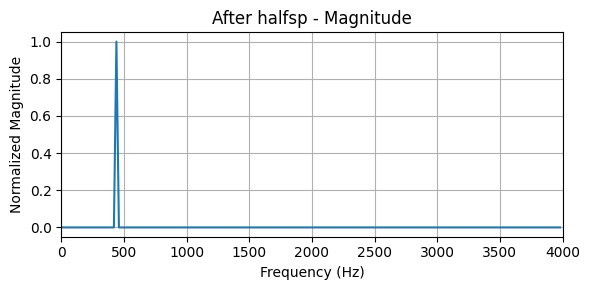

In [26]:
tone_1 = tonegen(220, 0.1, 1, 8000)
tone_2 = halfsp(tone_1)

# Save as WAV
wavfile.write('./generated/tone_prior_halfsp.wav', 8000, tone_1)
wavfile.write('./generated/tone_after_halfsp.wav', 8000, tone_2)

# Play the audio
display(ipd.Audio(tone_1, rate=8000))
display(ipd.Audio(tone_2, rate=8000))


# Plot time domain as subplots
plt.subplot(2, 1, 1)
plt.plot(tone_1, label='Original')
plt.plot(tone_2, label='After halfsp')
plt.legend()
plt.title('Time Domain - Original vs After halfsp')
plt.show()

# Original FFT
plot_fft(tone_1, 8000, 'Original', figsize=(6, 3))

# After halfsp FFT
plot_fft(tone_2, 8000, 'After halfsp', figsize=(6, 3))


# 6) Faça a mesma análise no tempo e frequência em relação à função doublesp.

Após a aplicação da função doublesp, o sinal fica com o dobro das amostras, ou seja o tempo de duração é o dobro do original e a frequência é a metade do original.

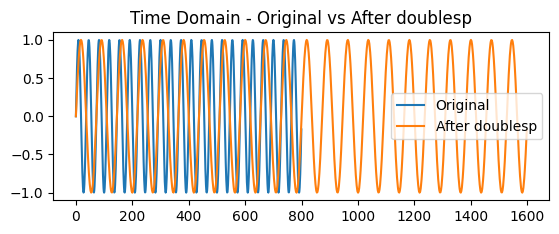

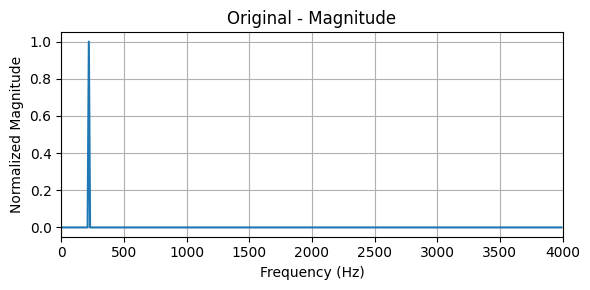

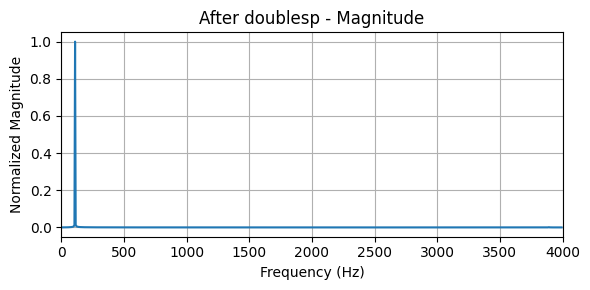

In [27]:
tone_1 = tonegen(220, 0.1, 1, 8000)
tone_2 = doublesp(tone_1)

# Save as WAV
wavfile.write('./generated/tone_prior_doublesp.wav', 8000, tone_1)
wavfile.write('./generated/tone_after_doublesp.wav', 8000, tone_2)

# Play the audio
display(ipd.Audio(tone_1, rate=8000))
display(ipd.Audio(tone_2, rate=8000))

# Plot time domain as subplots
plt.subplot(2, 1, 1)
plt.plot(tone_1, label='Original')
plt.plot(tone_2, label='After doublesp')
plt.legend()
plt.title('Time Domain - Original vs After doublesp')
plt.show()

# Original FFT
plot_fft(tone_1, 8000, 'Original', figsize=(6, 3))

# After halfsp FFT
plot_fft(tone_2, 8000, 'After doublesp', figsize=(6, 3))


# 7) Grave alguma frase com sua voz. Depois, observe e escute o resultado do processamento com:

* halfsp
* doublesp
* numpy.fliplr
* numpy.flipud

Apresente os resultados e comente qual o efeito de cada processamento.

In [28]:
fs, voice = wavfile.read('./assets/voice_sample_1.wav')

# Check if signal is mono or stereo
mono_audio = voice[:, 0] if voice.ndim == 2 else voice
stereo_audio = np.array([voice, voice]) if voice.ndim == 1 else voice

# halfsp and doublesp take mono signal and return mono signal
voice_halfsp = halfsp(mono_audio)
voice_doublesp = doublesp(mono_audio)

# fliplr and flipud take stereo signal and return stereo signal
voice_fliplr = np.fliplr(stereo_audio)
voice_flipud = np.flipud(stereo_audio)

# Normalize audio
voice_halfsp = voice_halfsp / np.max(np.abs(voice_halfsp))
voice_doublesp = voice_doublesp / np.max(np.abs(voice_doublesp))
voice_fliplr = voice_fliplr / np.max(np.abs(voice_fliplr))
voice_flipud = voice_flipud / np.max(np.abs(voice_flipud))

# Save as WAV
wavfile.write('./generated/voice_sample_1_halfsp.wav', fs, voice_halfsp)
wavfile.write('./generated/voice_sample_1_doublesp.wav', fs, voice_doublesp)
wavfile.write('./generated/voice_sample_1_fliplr.wav', fs, voice_fliplr)
wavfile.write('./generated/voice_sample_1_flipud.wav', fs, voice_flipud)

# Play the audio
display(ipd.Audio(voice_halfsp, rate=fs))
display(ipd.Audio(voice_doublesp, rate=fs))
display(ipd.Audio(voice_fliplr[:, 0], rate=fs))
display(ipd.Audio(voice_flipud[:, 0], rate=fs))

## Resultados

### halfsp

O audio se tornou acelerado e a frequência da voz aumentou, tornando a voz mais aguda.

<div style="display: flex; justify-content: center;">
    <img src="./assets/halfsp.png" alt="Halfsp" height="500">
</div>

### doublesp

O audio se tornou mais lento e a frequência da voz diminuiu, tornando a voz mais grave.

<div style="display: flex; justify-content: center;">
    <img src="./assets/doublesp.png" alt="Doublesp" height="500">
</div>

### numpy.fliplr

Devido ao sinal gravado ser stereo e a shape com a qual o ocenaudio grava o wav a numpy.fliplr apenas trocou os canais L pelo R e vice-versa, assim não se notou diferença perceptível.

<div style="display: flex; justify-content: center;">
    <img src="./assets/fliplr.png" alt="Fliplr" height="500">
</div>

### numpy.flipud

Devido ao sinal gravado ser stereo e a shape com a qual o ocenaudio grava o wav a numpy.flipud inverteu o audio de ambos os canais no tempo, dando a impressão de que o audio foi gravado de trás para frente conforme pode ser visto na imagem abaixo.

<div style="display: flex; justify-content: center;">
    <img src="./assets/flipud.png" alt="Flipud" height="500">
</div>

# 8) Crie uma função que gere um modelo discreto de um sinal de eco

$$s_e(t) = \alpha s(t - T)$$

onde $\alpha$ é o fator de atenuação, $T$, o atraso (em segundos) e $s(t)$, o sinal original. Assuma que $0 \leq \alpha \leq 1$ e que $T \geq 0$. O sinal resultante, com eco, é

$$r(t) = s(t) + s_e(t)$$


1. **Gere sinais com eco** a partir de uma gravação de voz (teste antes com um ou dois impulsos para verificar seu código).
2. **Experimente com diferentes valores** de atenuação e atraso (teste, por exemplo, com fator de atenuação de 0,65 e atraso de 250 ms).
3. **Analise o impacto** sobre o sinal sintetizado.

In [29]:
def echo_model(s: np.array, alpha: float, T: float) -> np.array:
    return alpha * np.roll(s, int(T * fs))

def echo_signal(s: np.array, alpha: float, T: float) -> np.array:
    return s + echo_model(s, alpha, T)

fs, voice = wavfile.read('./assets/voice_sample_1.wav')
mono_audio = voice[:, 0] if voice.ndim == 2 else voice

# Create cases with different values of alpha and T
for alpha in np.arange(0.1, 1.1, 0.5):
    for T in np.arange(0.1, 0.3, 0.05):
        echo = echo_signal(mono_audio, alpha, T)
        # Normalize audio
        echo = echo / np.max(np.abs(echo))
        # Save as WAV
        wavfile.write(f'./generated/echoes/signal_A{alpha}_T{T}.wav', fs, echo)
        print(f"Echo model with alpha = {np.round(alpha, 2)} and T = {np.round(T, 2)}")
        display(ipd.Audio(echo, rate=fs))


Echo model with alpha = 0.1 and T = 0.1


Echo model with alpha = 0.1 and T = 0.15


Echo model with alpha = 0.1 and T = 0.2


Echo model with alpha = 0.1 and T = 0.25


Echo model with alpha = 0.6 and T = 0.1


Echo model with alpha = 0.6 and T = 0.15


Echo model with alpha = 0.6 and T = 0.2


Echo model with alpha = 0.6 and T = 0.25


Quando se aplica o modelo de echo, é esperado que uma copia do sinal original porém atrasada no tempo seja adicionada ao sinal original.
Assim, quanto maior for o coeficiente alpha, mais forte será a cópia do sinal original e quanto maior for o atraso T, mais atrasada estará a cópia do sinal original. Assim sendo, quando alpha é grande, temos um eco muito mais forte e perceptivel, ja quando T é grande temos a impressão que o eco é mais distante pois deemora até a copia ser ouvida.

Para T e alpha muito grandes juntos, gera-se uma sensação de não naturalidade, sendo que seria necessário um ambiente onde é possivel manter a energia do som sem atenuar por um longo período de tempo, por exemplo um longo tunel com uma parede muito distance que reflete o som.

# 9) Acesse o banco de respostas ao impulso de ambientes em http://www.openairlib.net, link IR Data. Observe que as respostas são longas, geralmente maiores que 2 segundos.

Escolha uma resposta, baixe o arquivo e faça a operação de convolução do trecho de voz que você gravou com essa resposta de ambiente (certifique-se que as frequências de amostragem são as mesmas) usando numpy.convolve. Se as frequências de amostragem forem diferentes, você pode reamostrar um dos arquivos (áudio ou resposta) no Ocenaudio.

Meça o tempo de processamento para vários tamanhos de resposta, usando uma das formas descritas em https://cmdlinetips.com/2018/01/two-ways-to-compute-executing-time-in-python/. Faça um gráfico do tempo de processamento em função do tamanho da resposta (entre 100 ms e 3 s, com pelo menos 5 pontos; para fazer isso, você irá cortar a resposta). Comente.

FS Impulse: 48000, shape: (144000,)
FS Voice: 48000, shape: (501519,)
Convolved audio saved


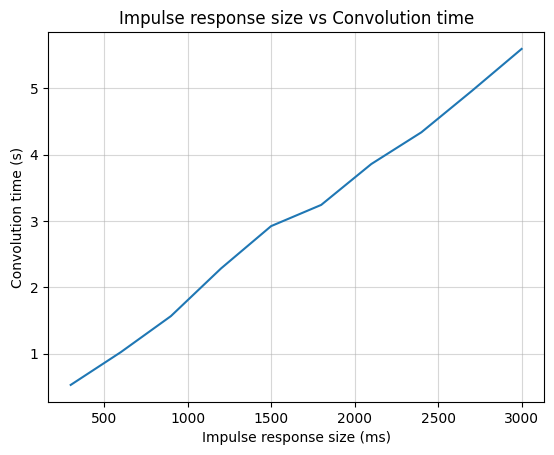

In [30]:
import time

# Using Falkland Palace Bottle Dungeon as the impulse response
# All credits to the original author https://www.openairlib.net/
fs_impulse, impulse = wavfile.read('./assets/impulse_responses/response_1.wav')
impulse = impulse[:, 0] if impulse.ndim == 2 else impulse
# Load voice sample
fs_voice, voice = wavfile.read('./assets/voice_sample_1.wav')
voice = voice[:, 0] if voice.ndim == 2 else voice

print(f"FS Impulse: {fs_impulse}, shape: {impulse.shape}")
print(f"FS Voice: {fs_voice}, shape: {voice.shape}")

execution_times = []
impulse_size_ms = []
n_times = 10
single_slice_size = impulse.shape[0] // n_times
for i in range(n_times):
    impulse_size = (i + 1)*single_slice_size
    cut_impulse = impulse[:impulse_size]
    impulse_size_ms.append((impulse_size / fs_impulse) * 1000)

    # Measure time for the convolution
    start = time.time()
    convolved_audio = np.convolve(voice, cut_impulse)
    elapsed_time = (time.time() - start)
    execution_times.append(elapsed_time)

# Convolve voice sample with impulse response
convolved_audio = np.convolve(voice, impulse)

# Normalize audio
convolved_audio = convolved_audio / np.max(np.abs(convolved_audio))
# Save as WAV
wavfile.write('./generated/voice_sample_1_convolved.wav', fs_voice, convolved_audio)
print("Convolved audio saved")
display(ipd.Audio(convolved_audio, rate=fs_voice))

# Plot the execution times
plt.grid(True, alpha=0.5)
plt.plot(impulse_size_ms, execution_times)
plt.xlabel('Impulse response size (ms)')
plt.ylabel('Convolution time (s)')
plt.title('Impulse response size vs Convolution time')
plt.show()

Comentários:

A operação de convolução entre o trecho de voz e a resposta ao impulso funciona para simular o som gravado em um ambiente acústico. O sinal seco (voz) passa a soar como se tivesse sido gravado dentro do ambiente cuja resposta ao impulso foi usada. No caso de uma *dungeon* como a do OpenAIR, a voz fica com reverberação longa, cauda difusa e sensação clara de estar em um espaço fechado e reverberante.

Os testes de desempenho mostram que o **tempo de processamento cresce conforme o tamanho do IR**. Isso ocorre porque `numpy.convolve` implementa a convolução direta, cuja complexidade é proporcional ao produto dos comprimentos dos sinais (O(N·M)). Assim, usar um IR de 100 ms é bem mais rápido do que usar um IR de 3 segundos.